In [166]:
import bayesian
reload(bayesian)

<module 'bayesian' from '/home/ryan/bnn/semantic-segmentation-pytorch/bayesian.py'>

In [265]:
from myutils import *
from bayesian import *
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
plt.rc('figure', figsize=(16, 4.5))
get_ipython().ast_node_interactivity = 'all'

from tqdm import trange, tqdm

In [291]:
cfg.merge_from_file('/home/ryan/bnn/semantic-segmentation-pytorch/config/bdd100k-mobilenetv2dilated-c1_deepsup.yaml')

cfg.MODEL.weights_encoder = os.path.join(
    cfg.DIR, 'encoder_' + cfg.BAYESIAN.checkpoint)
cfg.MODEL.weights_decoder = os.path.join(
    cfg.DIR, 'decoder_' + cfg.BAYESIAN.checkpoint)
assert os.path.exists(cfg.MODEL.weights_encoder) and \
    os.path.exists(cfg.MODEL.weights_decoder), "checkpoint does not exitst!"

cfg.TRAIN.batch_size = cfg.TRAIN.batch_size_per_gpu
cfg.TRAIN.max_iters = cfg.TRAIN.epoch_iters * cfg.TRAIN.num_epoch
# cfg.DATASET.imgSizes = (450,)
colors = load_colors(cfg.DATASET.colors_file)
names = load_names(cfg.DATASET.names_file)
for i, n in names.items():
    globals()[n.upper()+'_CLASS'] = i

cm = mpl.colors.ListedColormap(colors/255)
cm.set_under('black')
nonorm = mpl.colors.NoNorm()

segSize = (720, 1280) # (576, 1024)

In [173]:
net_encoder = ModelBuilder.build_encoder(
    arch=cfg.MODEL.arch_encoder.lower(),
    fc_dim=cfg.MODEL.fc_dim,
    weights=cfg.MODEL.weights_encoder).cuda()
net_decoder = ModelBuilder.build_decoder(
    arch=cfg.MODEL.arch_decoder.lower(),
    fc_dim=cfg.MODEL.fc_dim,
    num_class=cfg.DATASET.num_class,
    weights=cfg.MODEL.weights_decoder, use_softmax=True).cuda()
bnn_decoder = BayesianC1_2(ModelBuilder.build_decoder(
    arch=cfg.MODEL.arch_decoder.lower(),
    fc_dim=cfg.MODEL.fc_dim,
    num_class=cfg.DATASET.num_class,
    weights=cfg.MODEL.weights_decoder).cuda())

crit = nn.NLLLoss(ignore_index=-1)
seg_module = SegmentationModule(net_encoder, net_decoder, crit).cuda()
seg_module.eval();
bnn_module = BayesianSegmentationModule(net_encoder, bnn_decoder)

load_checkpoint(bnn_decoder, cfg, 10)

torch.autograd.set_grad_enabled(False);

Loading weights for net_encoder
Loading weights for net_decoder
Loading weights for net_decoder


In [15]:
dataset_train = TrainDataset(
    cfg.DATASET.root_dataset,
    cfg.DATASET.list_train,
    cfg.DATASET,
    batch_per_gpu=cfg.TRAIN.batch_size_per_gpu)
dataset_val = ValDataset(
    cfg.DATASET.root_dataset,
    cfg.DATASET.list_val,
    cfg.DATASET)

loader_train = torch.utils.data.DataLoader(
    dataset_train,
    batch_size=1,
    shuffle=False,
    collate_fn=lambda batch: batch[0],
    num_workers=cfg.TRAIN.workers,
    drop_last=True,
    pin_memory=True)

iterator_train = iter(loader_train)

# samples: 7000
# samples: 1000


In [16]:
def subbatch(b, i):
    feed_dict = b.copy()
    feed_dict['img_data'] = b['img_data'][i]
    feed_dict = async_copy_to(feed_dict, 0)
    return feed_dict

In [236]:
def scale(img, segSize):
    return F.interpolate(img.unsqueeze(0), size=segSize, mode='bilinear', align_corners=False).squeeze(0)

def predict(scores, segSize):
    return scale(scores.mean(0), segSize)

def show_seg(seg):
    plt.imshow(seg, cmap=cm, norm=nonorm, interpolation='nearest')

def colorbar():
    cb = plt.colorbar(ax=plt.gcf().axes, ticks=range(len(names)))
    cb.ax.set_yticklabels(list(names.values()))

In [257]:
bad_val = ValDataset(cfg.DATASET.root_dataset,
    '../bdd100k/seg/bad_val.odgt', cfg.DATASET)
good_val = ValDataset(cfg.DATASET.root_dataset,
    '../bdd100k/seg/good_val.odgt', cfg.DATASET)
bad_car_val = ValDataset(cfg.DATASET.root_dataset,
    '../bdd100k/seg/bad_car_val.odgt', cfg.DATASET)
good_car_val = ValDataset(cfg.DATASET.root_dataset,
    '../bdd100k/seg/good_car_val.odgt', cfg.DATASET)
bad_combined_val = ValDataset(cfg.DATASET.root_dataset,
    '../bdd100k/seg/bad_combined_val.odgt', cfg.DATASET)
good_combined_val = ValDataset(cfg.DATASET.root_dataset,
    '../bdd100k/seg/good_combined_val.odgt', cfg.DATASET)

# samples: 100
# samples: 100
# samples: 100
# samples: 100
# samples: 100
# samples: 100


In [176]:
b = bad_val[3]

In [177]:
b['img_ori'].shape, b['seg_label'].shape, b['img_data'][0].shape

((720, 1280, 3), torch.Size([1, 720, 1280]), torch.Size([1, 3, 304, 536]))

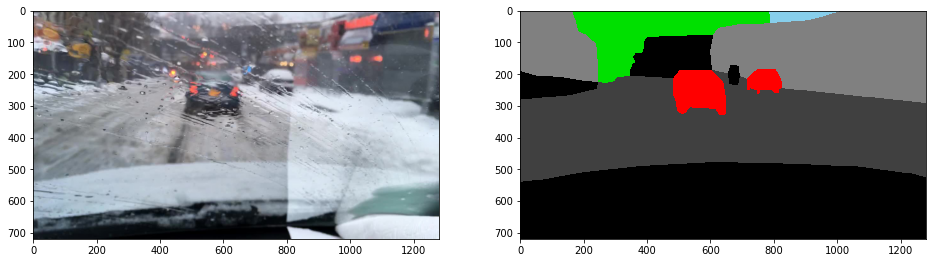

In [179]:
plt.subplot(121);
plt.imshow(b['img_ori']);
plt.subplot(122);
show_seg(b['seg_label'][0].cpu().numpy());

In [222]:
bb = subbatch(b, 0)
det_scores = seg_module(bb, segSize=segSize)[0].cpu()
bnn_scores = bnn_module.all_predictions(bb)[:, 0].cpu()

0.5399910838222032

0.559103451303822

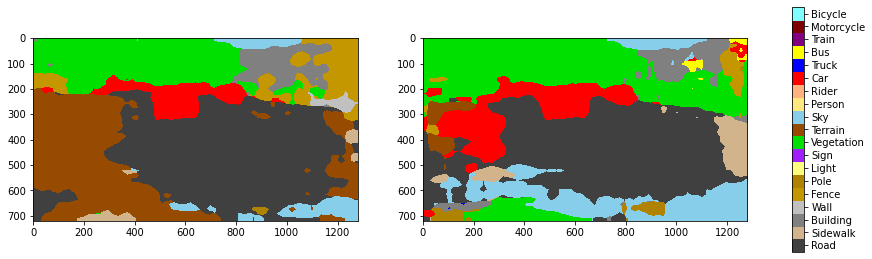

In [223]:
_=plt.subplot(121);
show_seg(det_scores.argmax(0).numpy());
_=plt.subplot(122);
show_seg(scale(bnn_scores.mean(0), segSize).argmax(0).numpy());
colorbar();
accuracy(det_scores.argmax(0).numpy(), as_numpy(bb['seg_label'][0]))[0]
accuracy(scale(bnn_scores.mean(0), segSize).argmax(0).numpy(), as_numpy(bb['seg_label'][0]))[0]

In [234]:
det_scores = 0.
bnn_scores = 0.
for i in range(5):
    bb = subbatch(b, i)
    det_scores += seg_module(bb, segSize=segSize)[0].cpu()/5.
    bnn_scores += bnn_module.predict(bb, segSize)[0].cpu()/5.

0.3123347214201039

0.5830825658328013

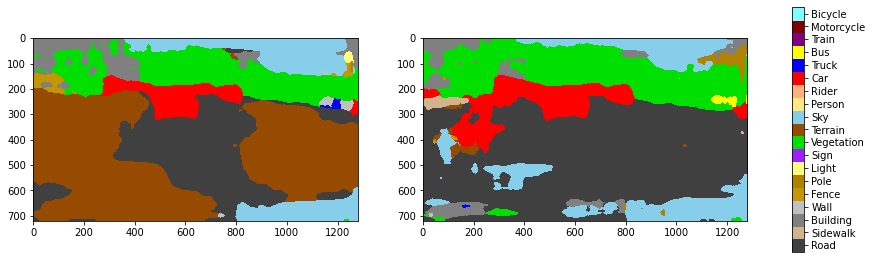

In [235]:
_=plt.subplot(121);
show_seg(det_scores.argmax(0).numpy());
_=plt.subplot(122);
show_seg(bnn_scores.argmax(0).numpy());
colorbar();
accuracy(det_scores.argmax(0).numpy(), as_numpy(bb['seg_label'][0]))[0]
accuracy(bnn_scores.argmax(0).numpy(), as_numpy(bb['seg_label'][0]))[0]

In [239]:
def uncertainty(scores):
    scores = scores.cpu().numpy()
    seg = scores.mean(0).argmax(0)
#     probs = np.exp(scores)
    uncert = np.zeros_like(seg, float)
    per_class = []
    for c in range(scores.shape[-3]):
        mask = seg == c
        std = scores[..., c, mask].std(0)
        uncert[mask] = std
        per_class.append(np.mean(std**2)**.5)
    return uncert, per_class

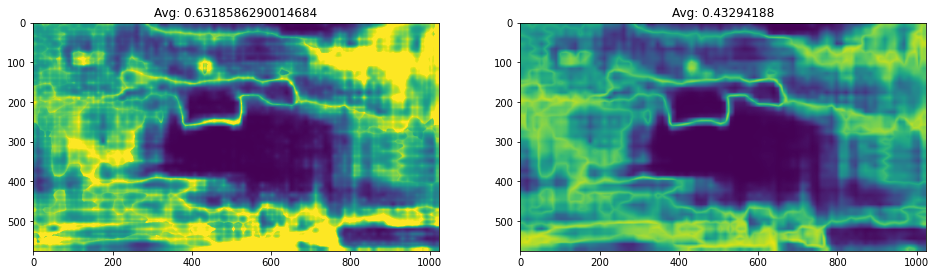

In [138]:
plt.subplot(121)
uncert, per_class = uncertainty(bnn_scores)
plt.imshow(uncert, vmin=0, vmax=1)
plt.title('Avg: %s' % (np.mean(uncert**2)**.5))
plt.subplot(122)
plt.draw()

unconf = (1 - bnn_scores.mean(0).max(0).values.exp()).numpy()
plt.imshow(unconf, vmin=0, vmax=1)
plt.title('Avg: %s' % np.mean(unconf));
# plt.show()

Text(0.5, 1.0, 'Avg: -1.5630668')

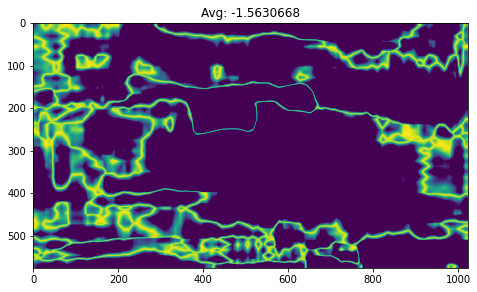

In [139]:
a, b = bnn_scores.mean(0).topk(2,0).values
diff2 = (1.-abs(a-b)).numpy()
plt.imshow(diff2, vmin=0, vmax=1)
plt.title('Avg: %s' % diff2.mean())

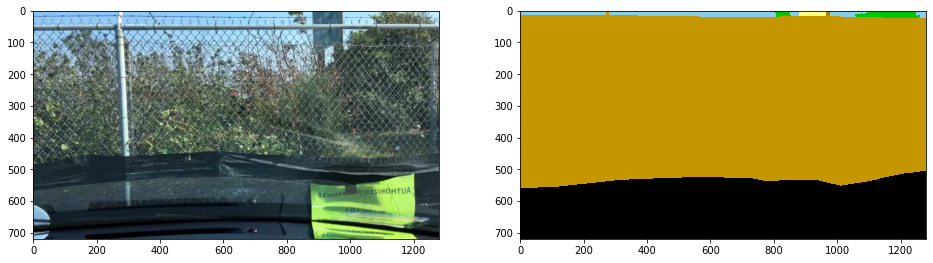

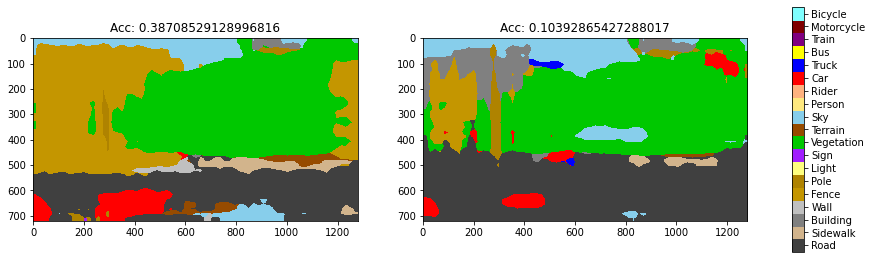

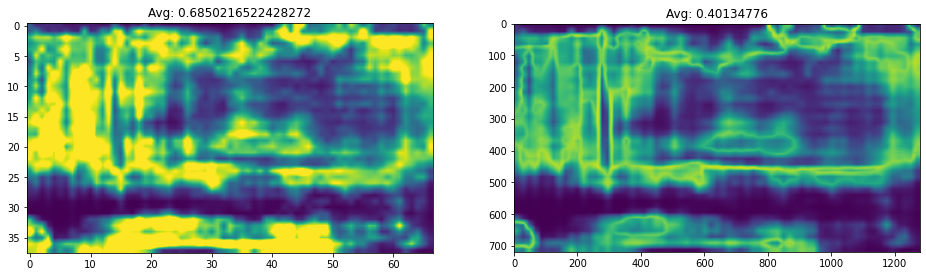

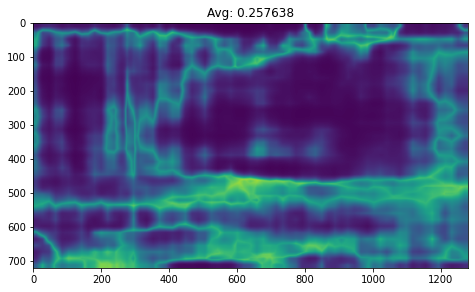

Car std: 1.074075529781417
Truck std: 0.9871980966142362
Bus std: nan
Bike std: nan
Motorcycle std: nan
Person std: nan


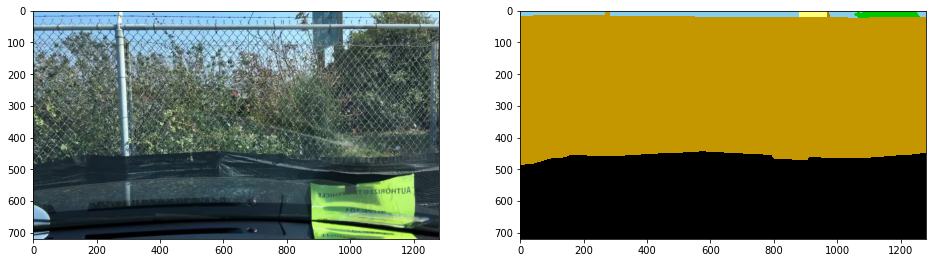

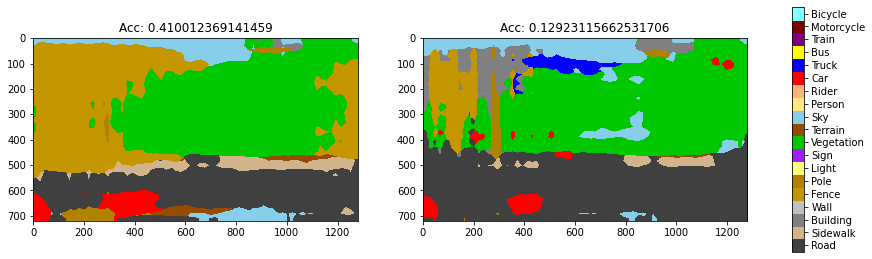

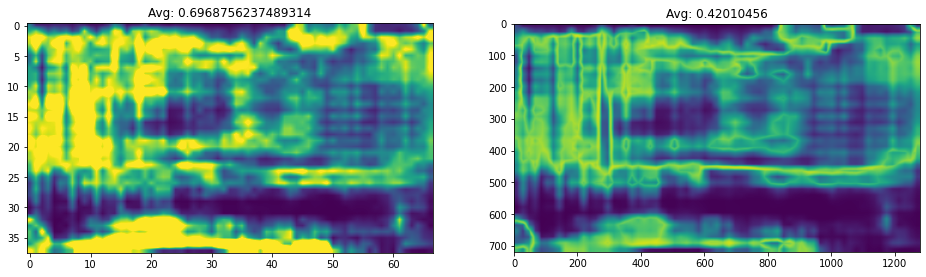

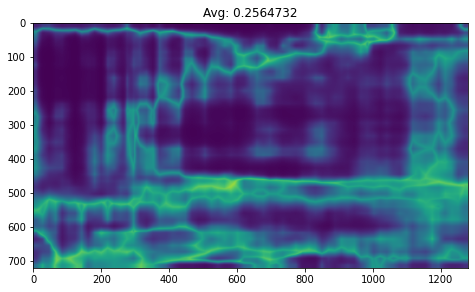

Car std: 1.0930278028632352
Truck std: 0.9707431593071119
Bus std: nan
Bike std: nan
Motorcycle std: nan
Person std: nan


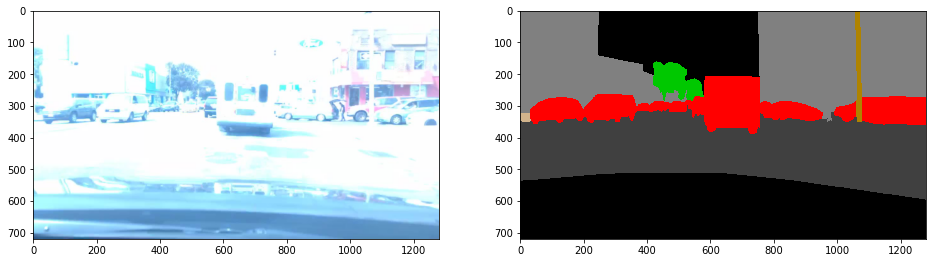

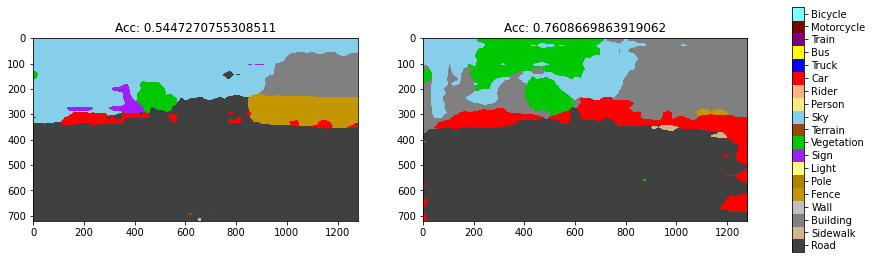

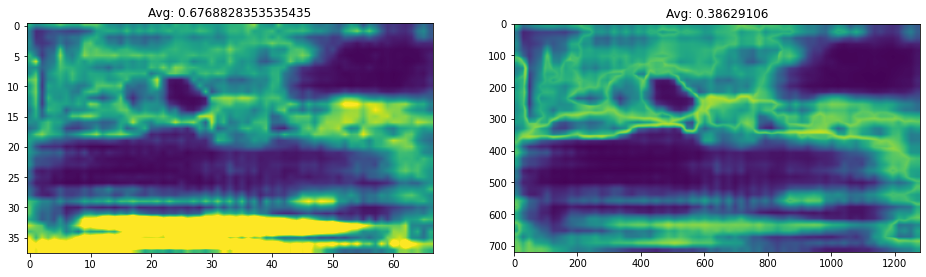

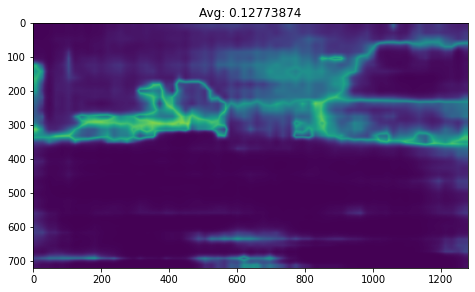

Car std: 0.6348282064252708
Truck std: nan
Bus std: nan
Bike std: nan
Motorcycle std: nan
Person std: nan


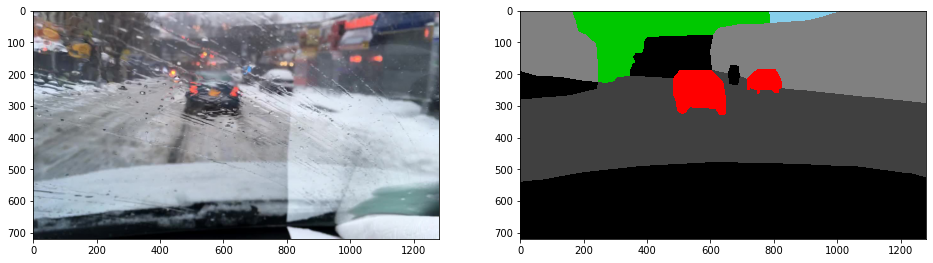

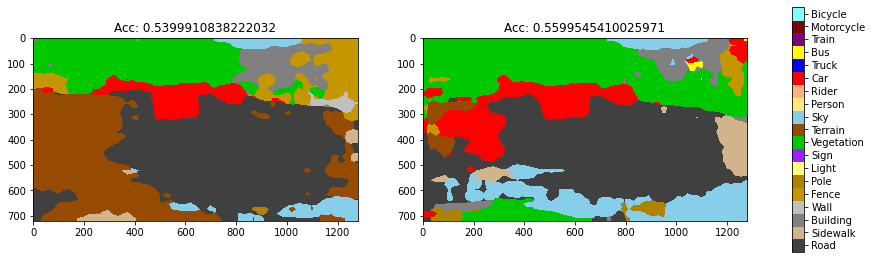

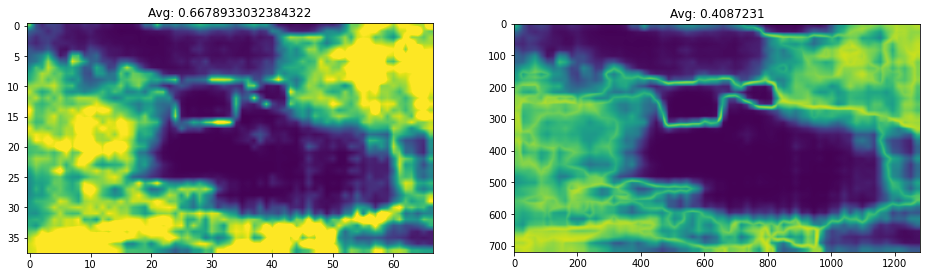

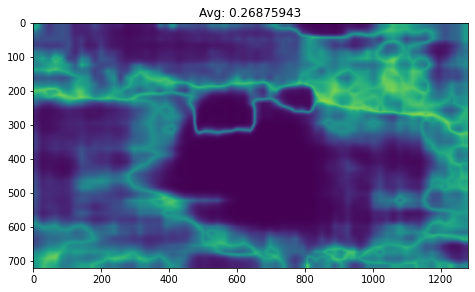

Car std: 0.7466007128037924
Truck std: nan
Bus std: 1.6621927135118257
Bike std: nan
Motorcycle std: nan
Person std: nan


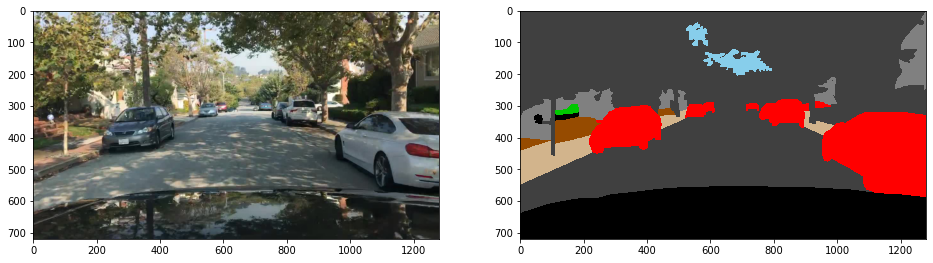

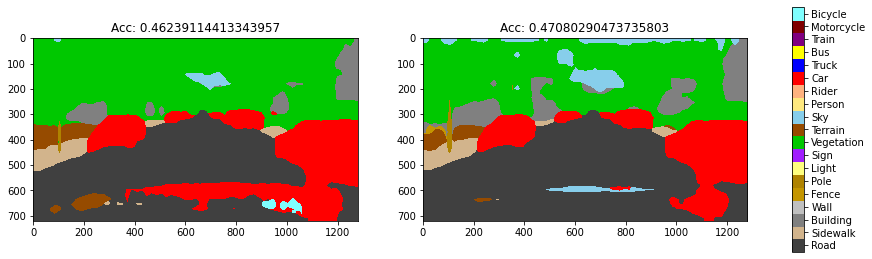

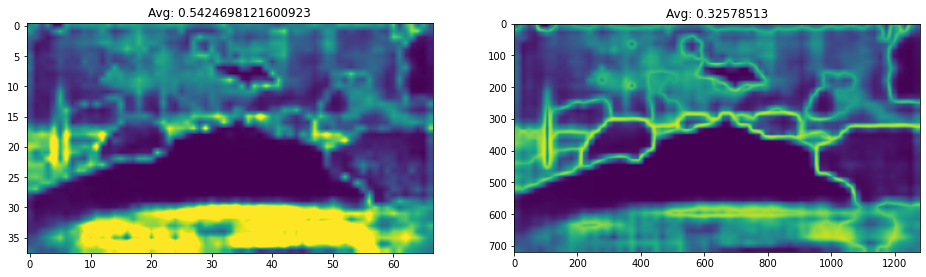

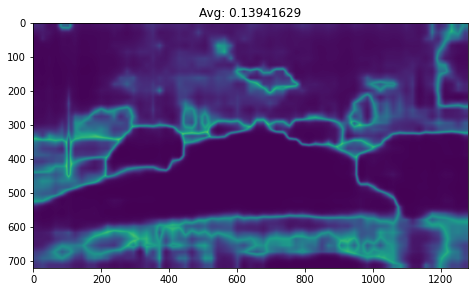

Car std: 0.5107769926914227
Truck std: nan
Bus std: nan
Bike std: nan
Motorcycle std: nan
Person std: nan


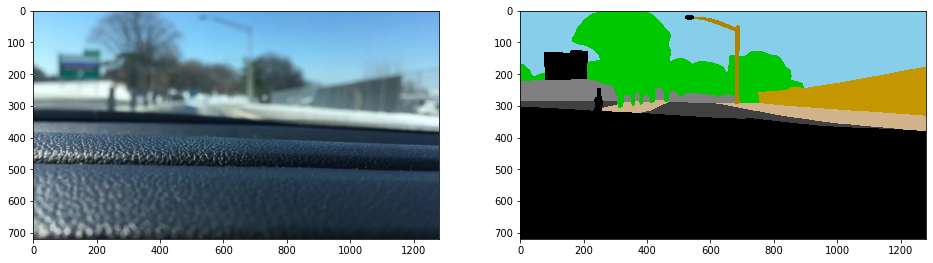

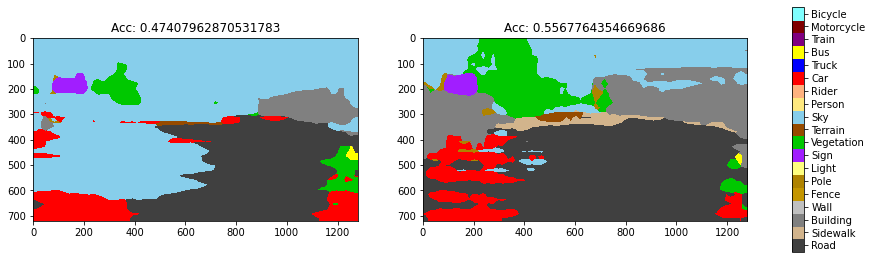

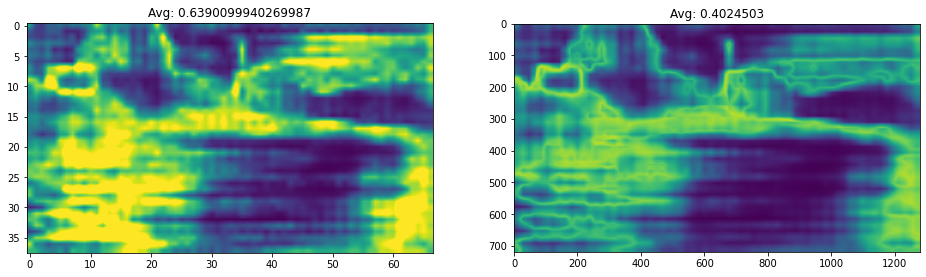

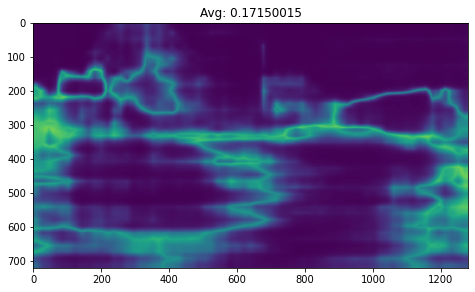

Car std: 0.8997415449651964
Truck std: nan
Bus std: 1.1291047024118197
Bike std: nan
Motorcycle std: nan
Person std: nan


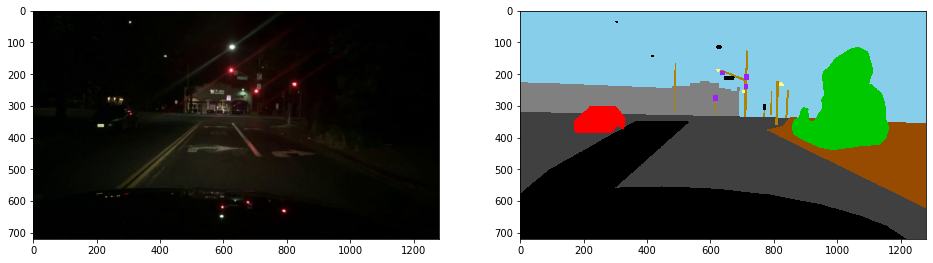

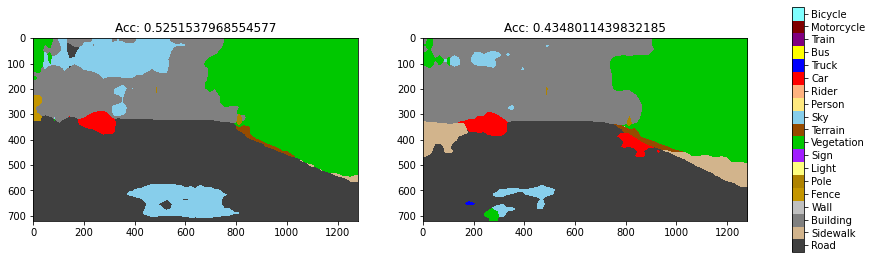

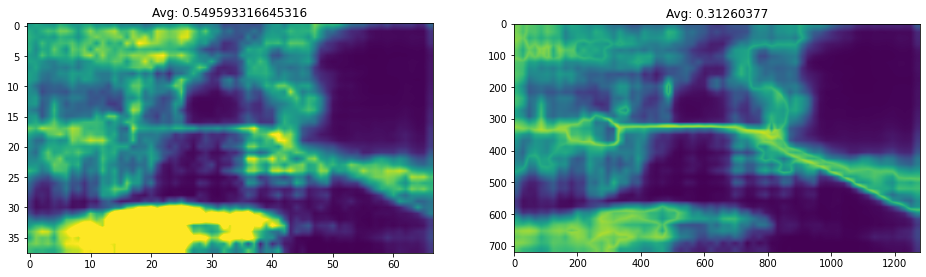

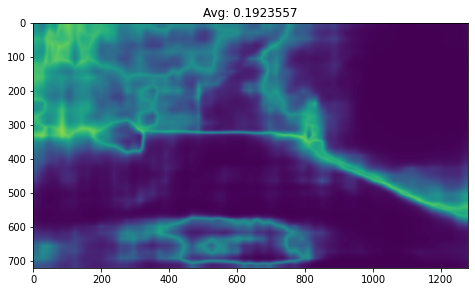

Car std: 0.664847773574506
Truck std: 1.1927321763410972
Bus std: nan
Bike std: nan
Motorcycle std: nan
Person std: nan


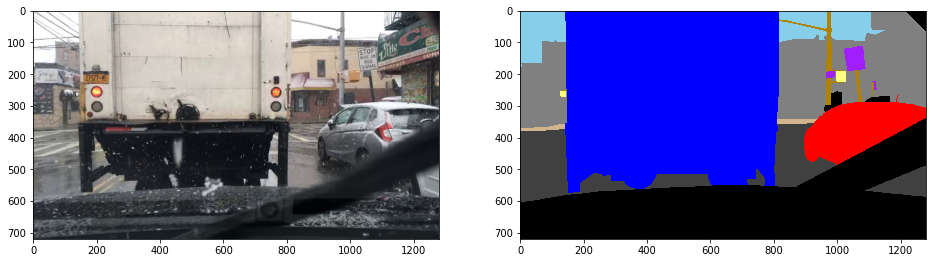

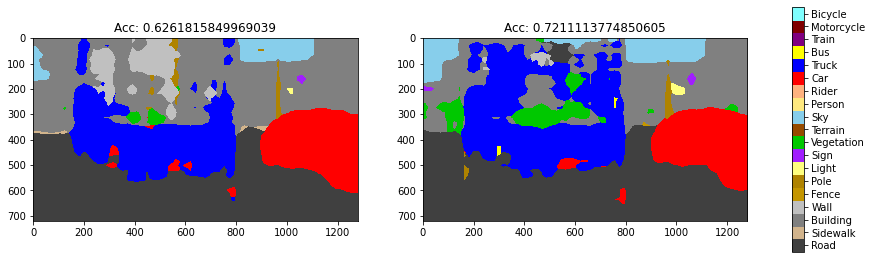

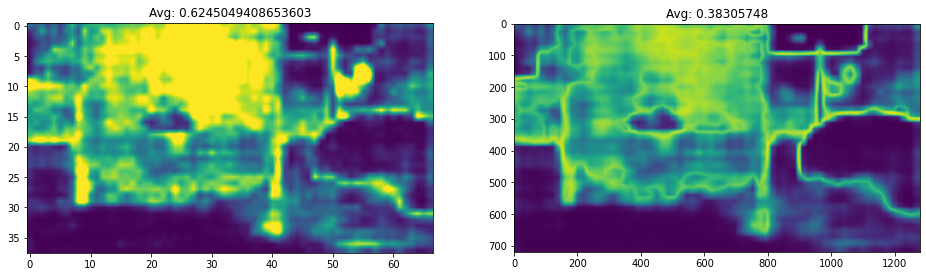

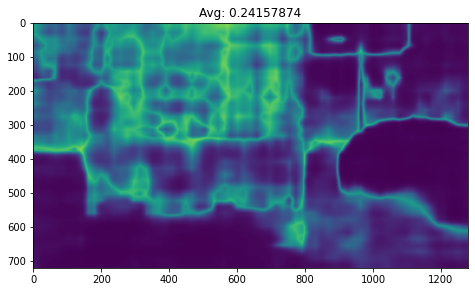

Car std: 0.37506287762877644
Truck std: 0.8308540218523374
Bus std: 0.9708164386889169
Bike std: nan
Motorcycle std: nan
Person std: nan


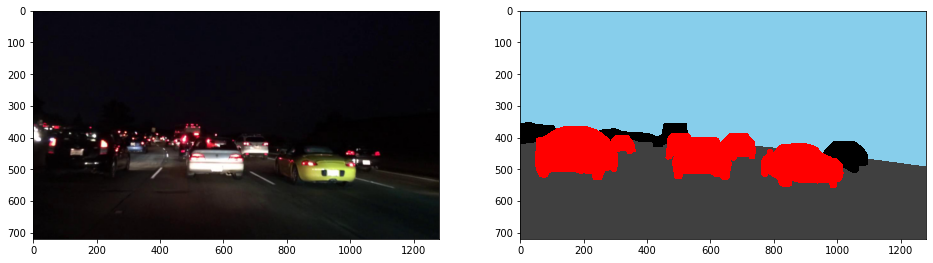

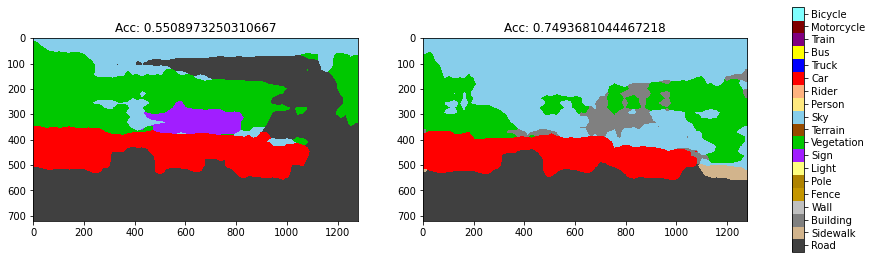

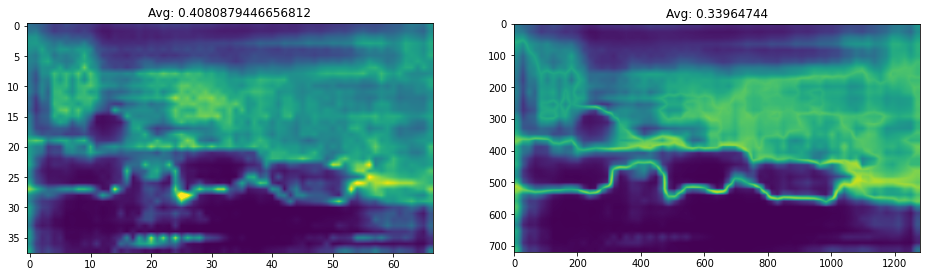

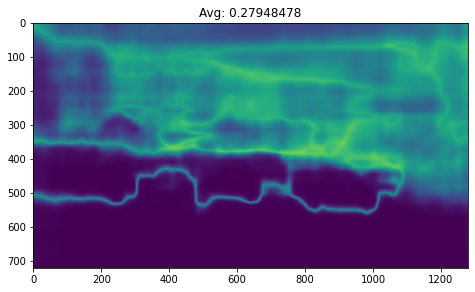

Car std: 0.36109607565381385
Truck std: nan
Bus std: nan
Bike std: nan
Motorcycle std: nan
Person std: nan


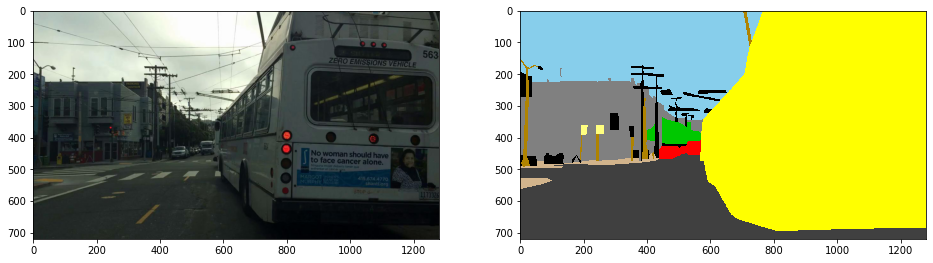

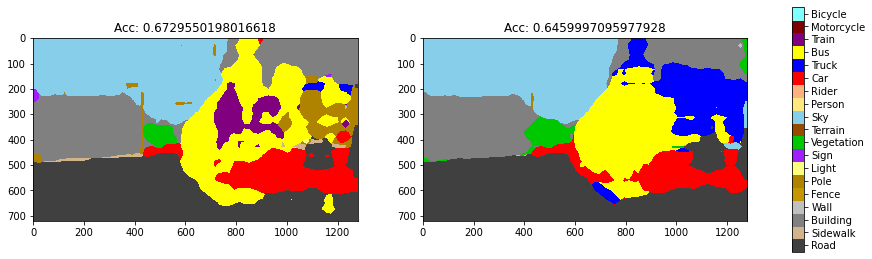

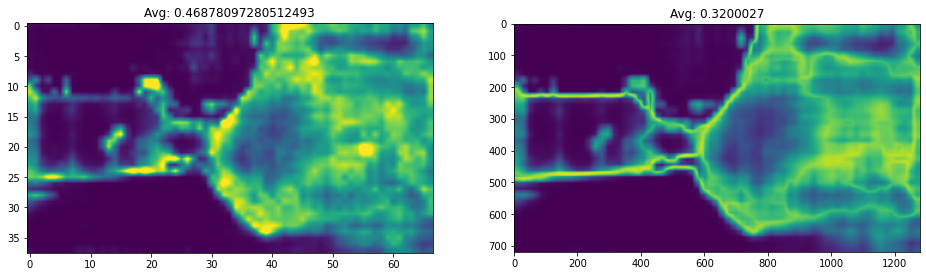

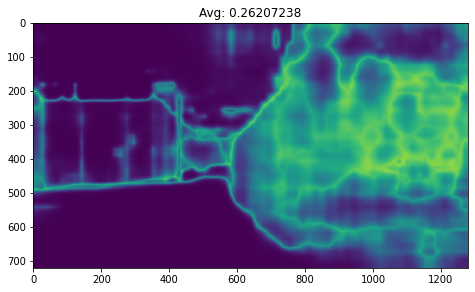

Car std: 0.6377664850542599
Truck std: 0.6934696593354926
Bus std: 0.6382460501593819
Bike std: nan
Motorcycle std: nan
Person std: nan


In [293]:
for i in range(10):
    b = bad_val[i]
    _=plt.subplot(121);
    _=plt.imshow(b['img_ori']);
    _=plt.subplot(122);
    show_seg(b['seg_label'][0].cpu().numpy());
    bb = subbatch(b, 0)
    det_scores = seg_module(bb, segSize=segSize)[0].cpu()
    bnn_scores = bnn_module.all_predictions(bb)[:, 0].cpu()
    bnn_scores1 = predict(bnn_scores, segSize)
    plt.show()
    
    _=plt.subplot(121);
    show_seg(det_scores.argmax(0).numpy());
    _=plt.title('Acc: %s' % accuracy(det_scores.argmax(0).numpy(), as_numpy(bb['seg_label'][0]))[0]);
    _=plt.subplot(122);
    show_seg(bnn_scores1.argmax(0).numpy());
    _=plt.title('Acc: %s' % accuracy(bnn_scores1.argmax(0).numpy(), as_numpy(bb['seg_label'][0]))[0])
    colorbar();
    plt.show()

    _=plt.subplot(121);
    uncert, per_class = uncertainty(bnn_scores)
    _=plt.imshow(uncert, vmin=0, vmax=1, interpolation='bilinear');
    _=plt.title('Avg: %s' % (np.mean(uncert**2)**.5));

    _=plt.subplot(122);
    unconf = (1 - bnn_scores1.max(0).values.exp()).numpy()
    _=plt.imshow(unconf, vmin=0, vmax=1, interpolation='bilinear');
    _=plt.title('Avg: %s' % np.mean(unconf));
    plt.show()
    
    unconf = (1 - det_scores.max(0).values).numpy()
    _=plt.imshow(unconf, vmin=0, vmax=1, interpolation='bilinear');
    _=plt.title('Avg: %s' % np.mean(unconf));
    plt.show()
    
    print('Car std:', per_class[CAR_CLASS])
    print('Truck std:', per_class[TRUCK_CLASS])
    print('Bus std:', per_class[BUS_CLASS])
    print('Bike std:', per_class[BICYCLE_CLASS])
    print('Motorcycle std:', per_class[MOTORCYCLE_CLASS])
    print('Person std:', per_class[PERSON_CLASS])

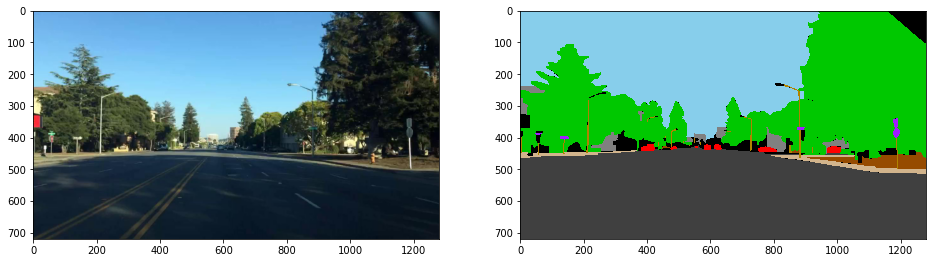

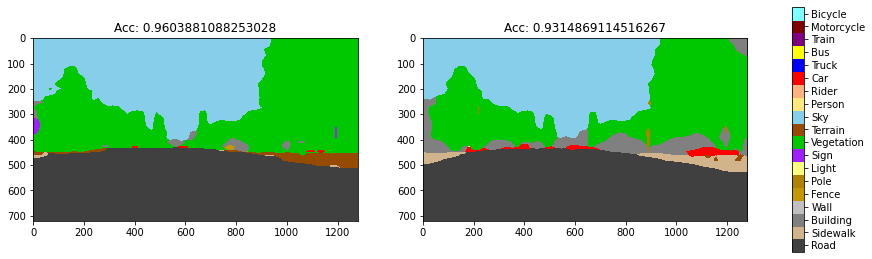

/home/ryan/.local/lib/python3.6/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/ryan/.local/lib/python3.6/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)


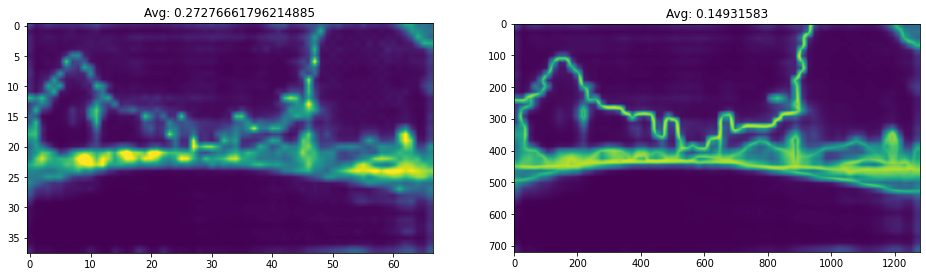

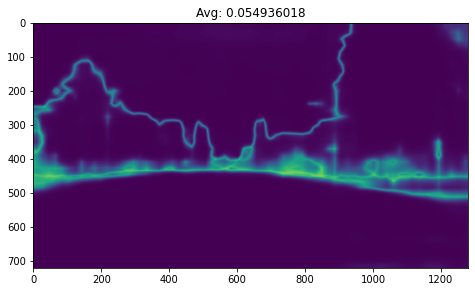

Car std: 0.807802817841876
Truck std: nan
Bus std: nan
Bike std: nan
Motorcycle std: nan
Person std: 1.4608876428919573


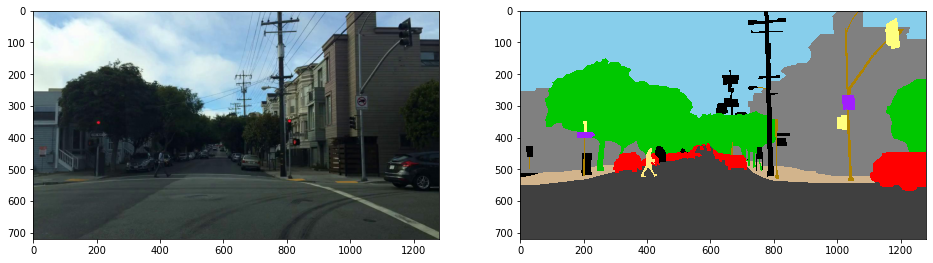

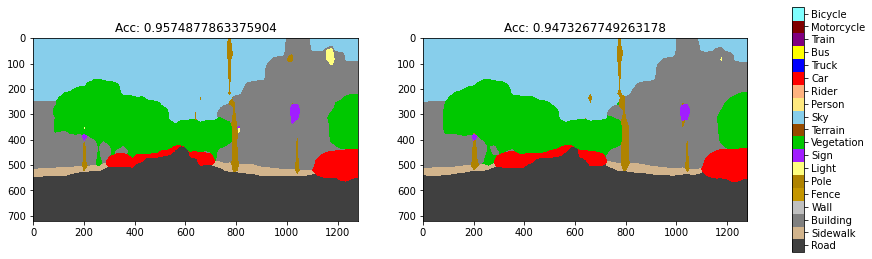

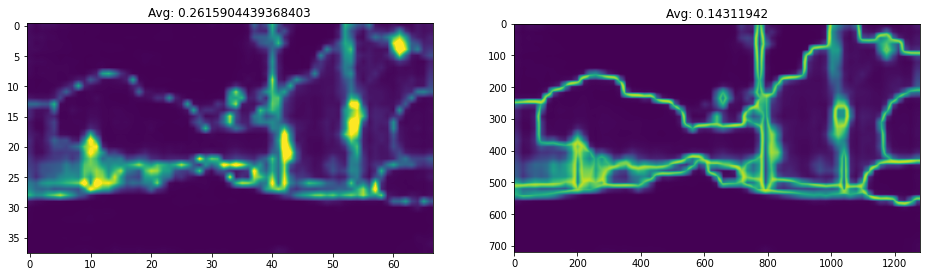

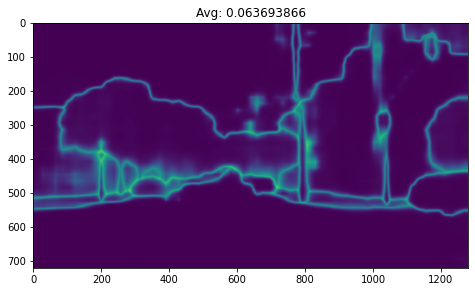

Car std: 0.4374243296169244
Truck std: nan
Bus std: nan
Bike std: nan
Motorcycle std: nan
Person std: nan


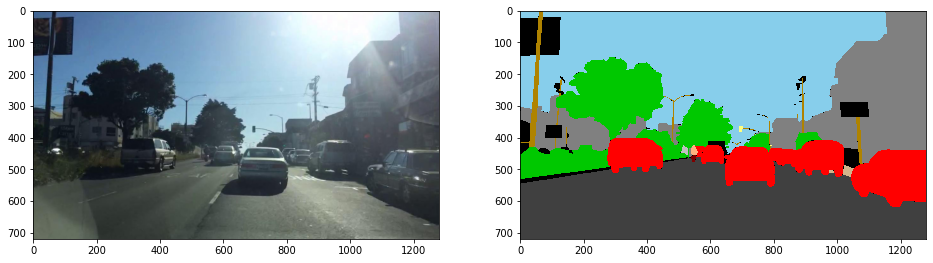

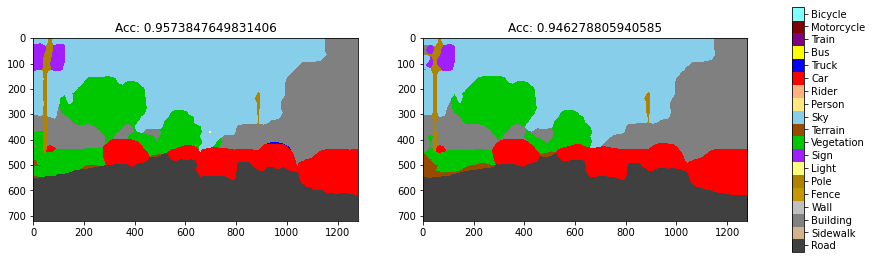

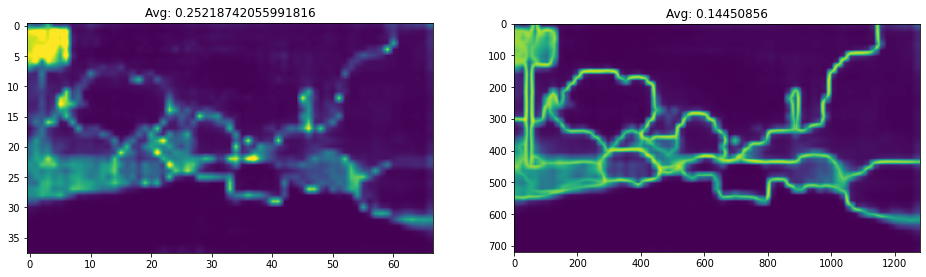

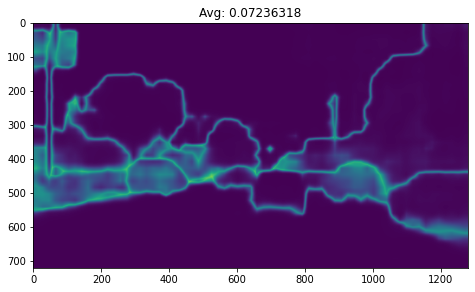

Car std: 0.3177098980328328
Truck std: nan
Bus std: nan
Bike std: nan
Motorcycle std: nan
Person std: nan


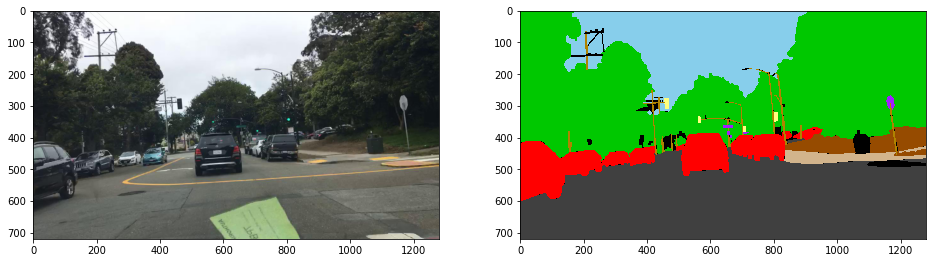

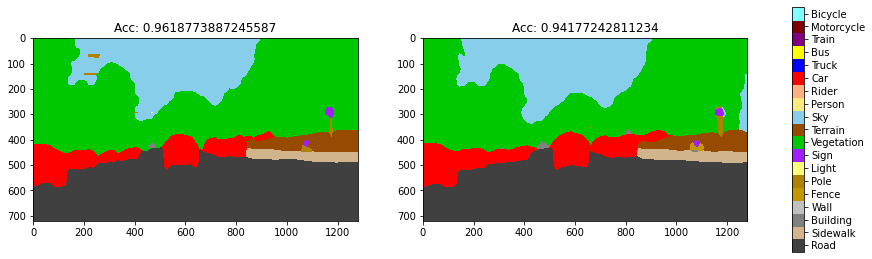

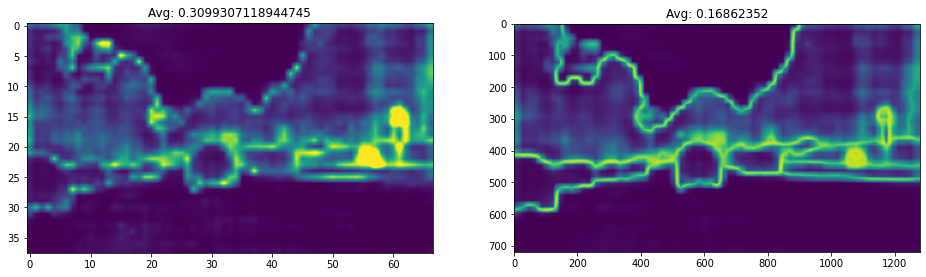

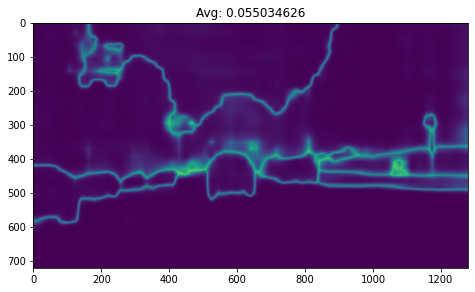

Car std: 0.39710596527791137
Truck std: nan
Bus std: nan
Bike std: nan
Motorcycle std: nan
Person std: nan


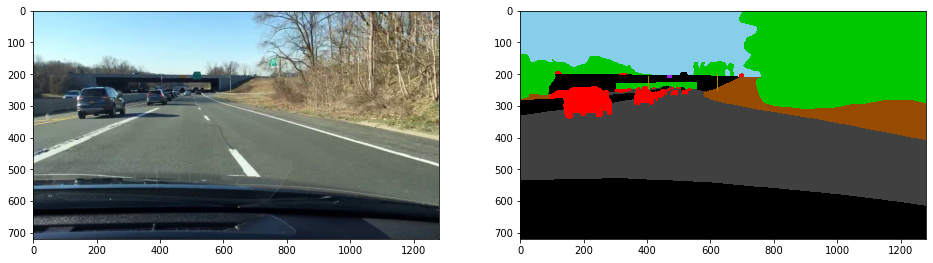

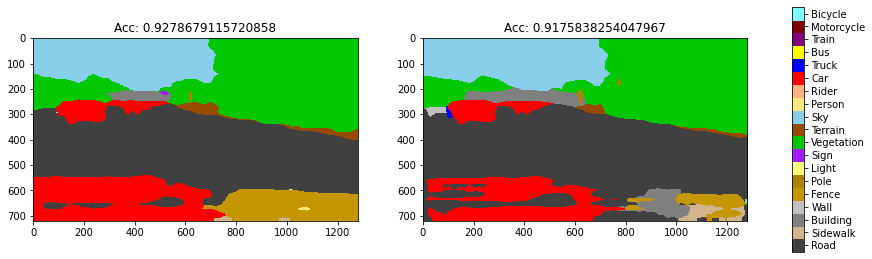

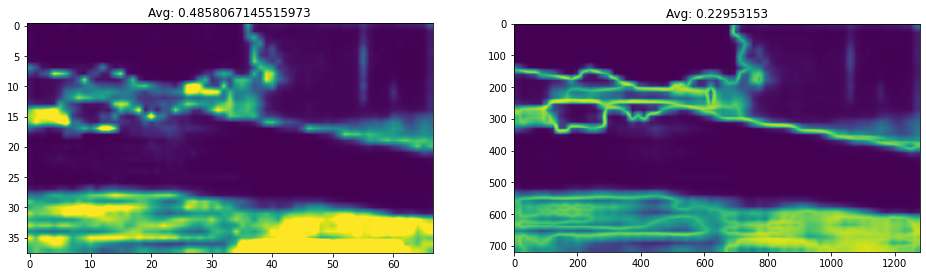

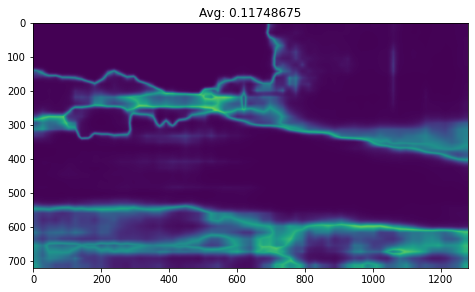

Car std: 0.6726430672340689
Truck std: 1.040526427219798
Bus std: nan
Bike std: nan
Motorcycle std: nan
Person std: nan


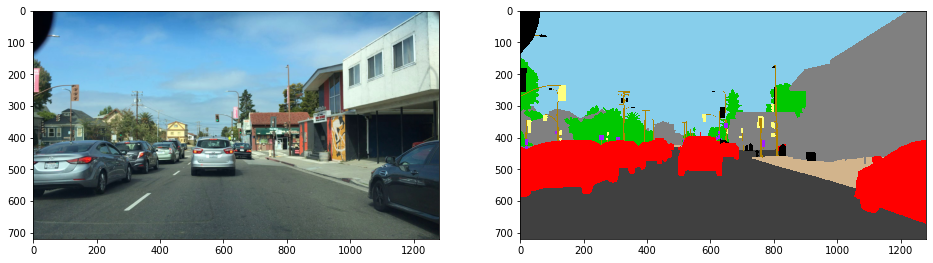

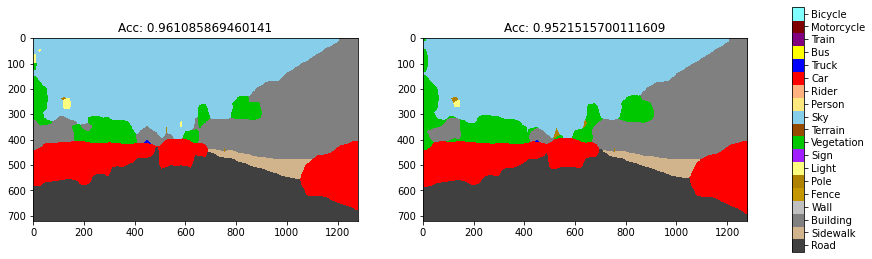

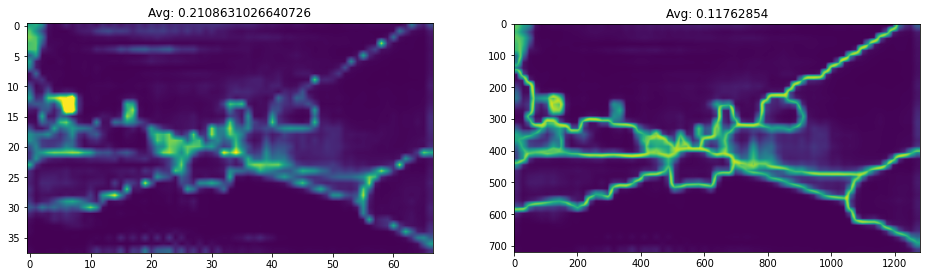

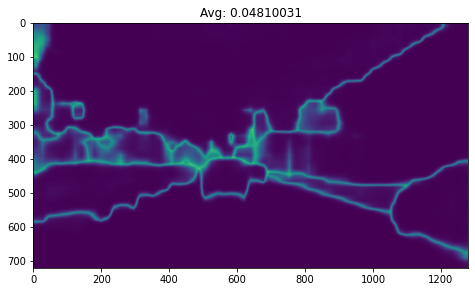

Car std: 0.2259069363510675
Truck std: 0.8721142252666126
Bus std: nan
Bike std: nan
Motorcycle std: nan
Person std: nan


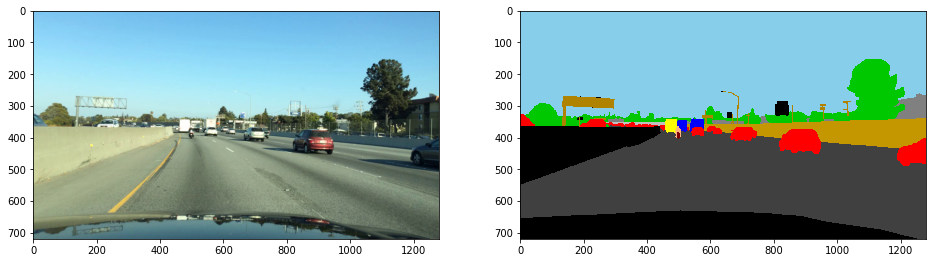

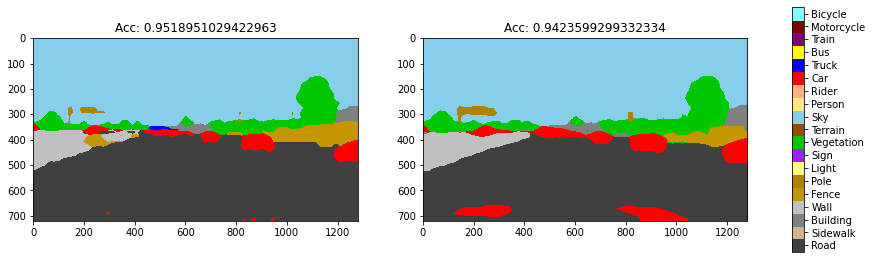

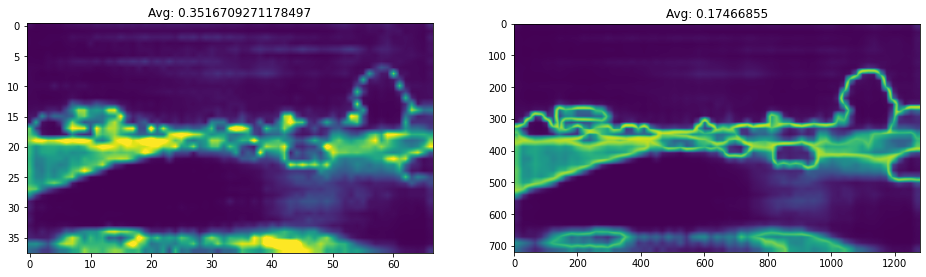

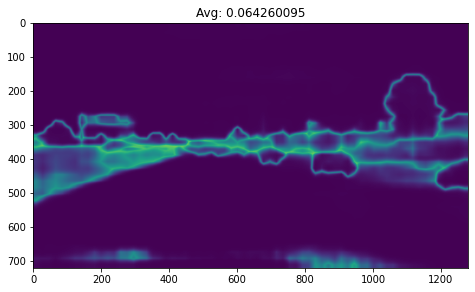

Car std: 0.6897487708921083
Truck std: nan
Bus std: nan
Bike std: nan
Motorcycle std: nan
Person std: nan


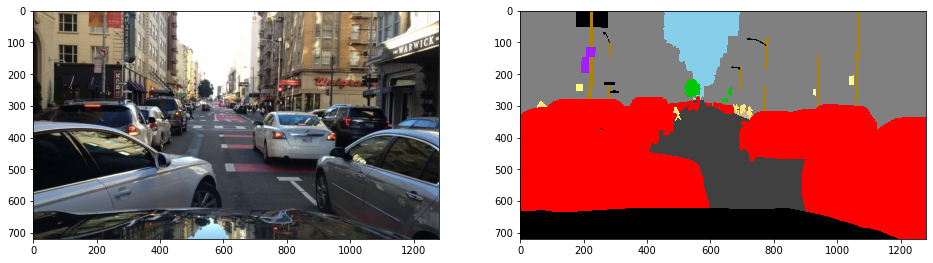

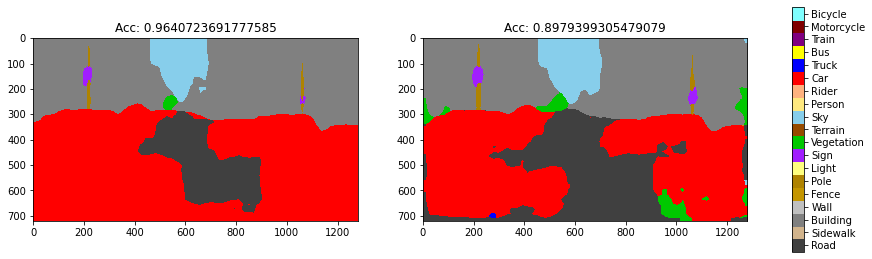

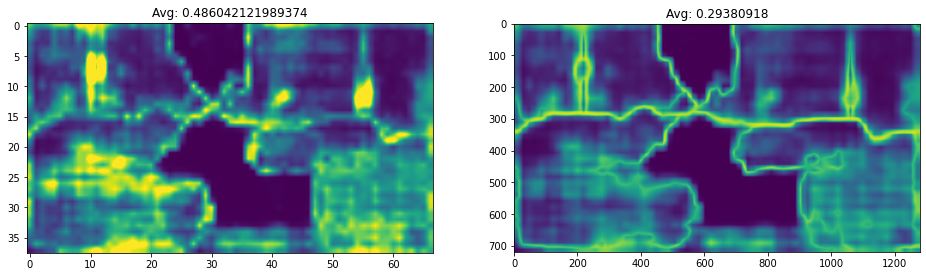

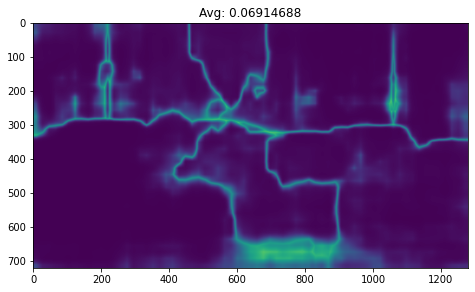

Car std: 0.5596624168768943
Truck std: 0.8074181160287969
Bus std: nan
Bike std: nan
Motorcycle std: nan
Person std: nan


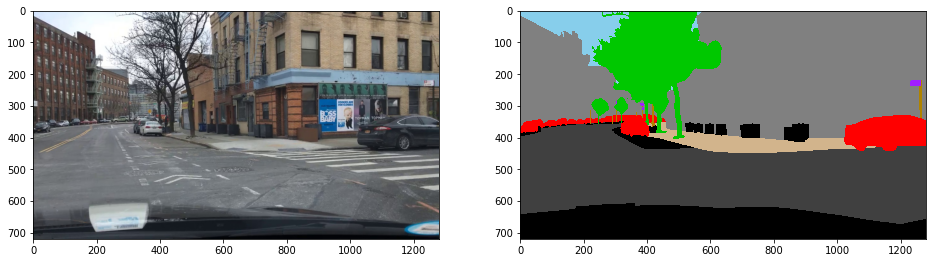

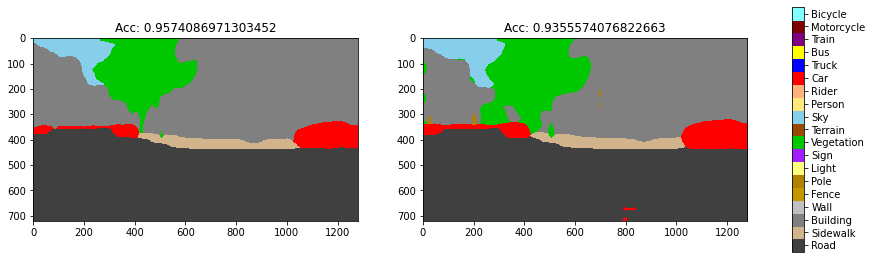

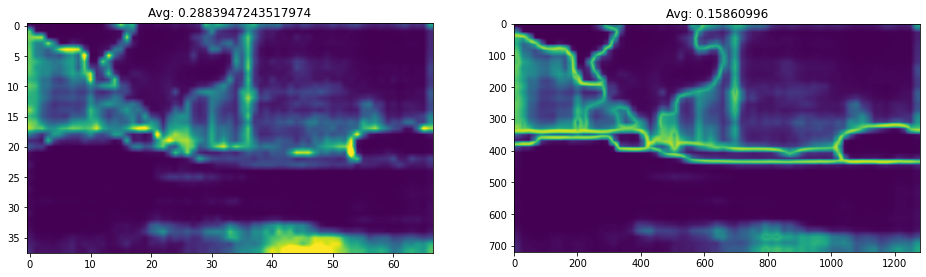

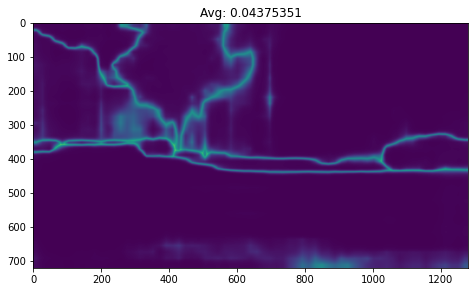

Car std: 0.37849890058828956
Truck std: nan
Bus std: nan
Bike std: nan
Motorcycle std: nan
Person std: nan


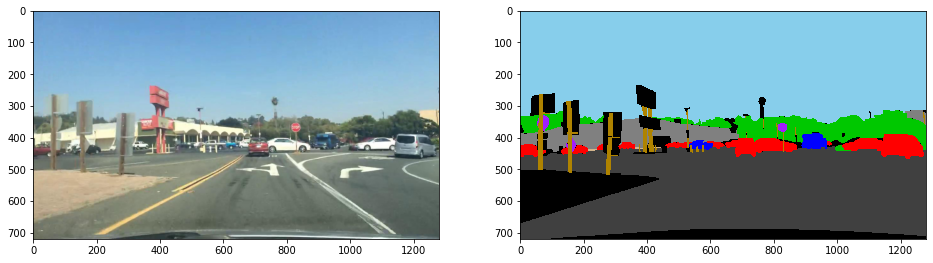

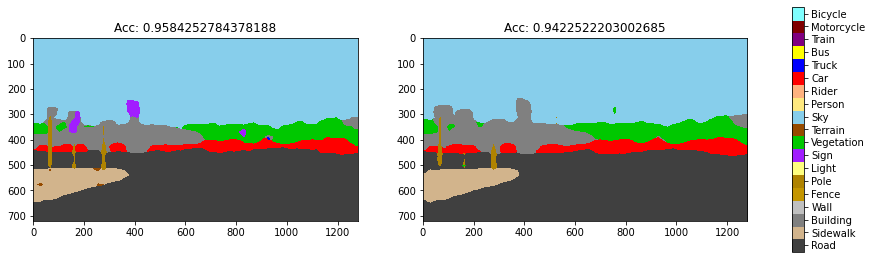

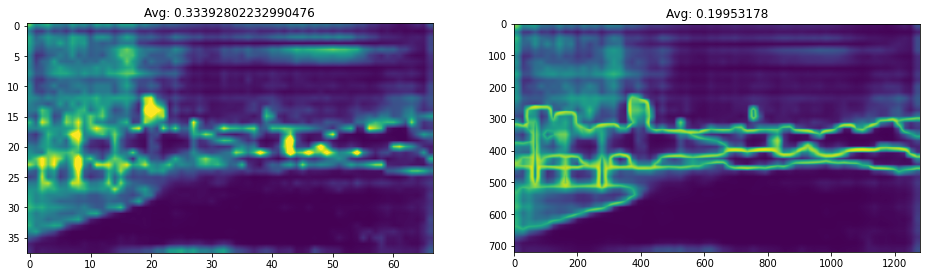

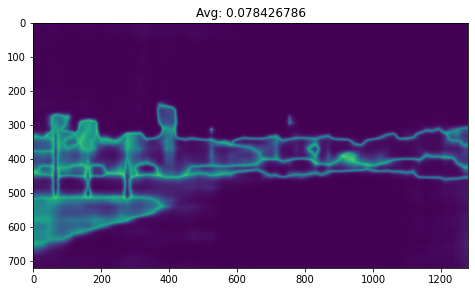

Car std: 0.5620247634712761
Truck std: nan
Bus std: nan
Bike std: nan
Motorcycle std: nan
Person std: nan


In [292]:
for i in range(10):
    b = good_val[i]
    _=plt.subplot(121);
    _=plt.imshow(b['img_ori']);
    _=plt.subplot(122);
    show_seg(b['seg_label'][0].cpu().numpy());
    bb = subbatch(b, 0)
    det_scores = seg_module(bb, segSize=segSize)[0].cpu()
    bnn_scores = bnn_module.all_predictions(bb)[:, 0].cpu()
    bnn_scores1 = predict(bnn_scores, segSize)
    plt.show()
    
    _=plt.subplot(121);
    show_seg(det_scores.argmax(0).numpy());
    _=plt.title('Acc: %s' % accuracy(det_scores.argmax(0).numpy(), as_numpy(bb['seg_label'][0]))[0]);
    _=plt.subplot(122);
    show_seg(bnn_scores1.argmax(0).numpy());
    _=plt.title('Acc: %s' % accuracy(bnn_scores1.argmax(0).numpy(), as_numpy(bb['seg_label'][0]))[0])
    colorbar();
    plt.show()

    _=plt.subplot(121);
    uncert, per_class = uncertainty(bnn_scores)
    _=plt.imshow(uncert, vmin=0, vmax=1, interpolation='bilinear');
    _=plt.title('Avg: %s' % (np.mean(uncert**2)**.5));

    _=plt.subplot(122);
    unconf = (1 - bnn_scores1.max(0).values.exp()).numpy()
    _=plt.imshow(unconf, vmin=0, vmax=1, interpolation='bilinear');
    _=plt.title('Avg: %s' % np.mean(unconf));
    plt.show()
    
    unconf = (1 - det_scores.max(0).values).numpy()
    _=plt.imshow(unconf, vmin=0, vmax=1, interpolation='bilinear');
    _=plt.title('Avg: %s' % np.mean(unconf));
    plt.show()
    
    print('Car std:', per_class[CAR_CLASS])
    print('Truck std:', per_class[TRUCK_CLASS])
    print('Bus std:', per_class[BUS_CLASS])
    print('Bike std:', per_class[BICYCLE_CLASS])
    print('Motorcycle std:', per_class[MOTORCYCLE_CLASS])
    print('Person std:', per_class[PERSON_CLASS])

In [ ]:
acc1 = []
acc2 = []
unc1 = []
unc2 = []
unc3 = []

for i in trange(50):
    b = bad_val[i]
    bb = subbatch(b, 0)
    det_scores = seg_module(bb, segSize=segSize)[0].cpu()
    bnn_scores = bnn_module.all_predictions(bb)[:, 0].cpu()
    bnn_scores1 = predict(bnn_scores, segSize)
    
    acc1.append(accuracy(det_scores.argmax(0).numpy(), as_numpy(b['seg_label'][0]))[0])
    acc2.append(accuracy(bnn_scores1.argmax(0).numpy(), as_numpy(b['seg_label'][0]))[0])
    
    uncert, per_class = uncertainty(bnn_scores)
    unc1.append(np.mean(uncert**2)**.5)

    unconf = (1 - bnn_scores1.max(0).values.exp()).numpy()
    unc2.append(np.mean(unconf))
    
    unconf = (1 - det_scores.max(0).values).numpy()
    unc3.append(np.mean(unconf))

In [277]:
print('acc1', np.mean(acc1), np.min(acc1), np.max(acc1))
print('acc2', np.mean(acc2), np.min(acc1), np.max(acc1))
print('unc1', np.mean(unc1), np.min(unc1), np.max(unc1))
print('unc2', np.mean(unc2), np.min(unc2), np.max(unc2))
print('unc3', np.mean(unc3), np.min(unc3), np.max(unc3))

acc1 0.6452015006548264 0.38708529128996816 0.8855749212088528
acc2 0.6295502808211567 0.38708529128996816 0.8855749212088528
unc1 0.4867955527501276 0.3215884125189081 0.6938942659116669
unc2 0.29695243 0.18153927 0.41288084
unc3 0.17862007 0.052670915 0.29541215


In [ ]:
acc1 = []
acc2 = []
unc1 = []
unc2 = []
unc3 = []

for i in trange(100):
    b = good_val[i]
    bb = subbatch(b, 0)
    det_scores = seg_module(bb, segSize=segSize)[0].cpu()
    bnn_scores = bnn_module.all_predictions(bb)[:, 0].cpu()
    bnn_scores1 = predict(bnn_scores, segSize)
    
    acc1.append(accuracy(det_scores.argmax(0).numpy(), as_numpy(bb['seg_label'][0]))[0])
    acc2.append(accuracy(bnn_scores1.argmax(0).numpy(), as_numpy(bb['seg_label'][0]))[0])
    
    uncert, per_class = uncertainty(bnn_scores)
    unc1.append(np.mean(uncert**2)**.5)

    unconf = (1 - bnn_scores1.max(0).values.exp()).numpy()
    unc2.append(np.mean(unconf))
    
    unconf = (1 - det_scores.max(0).values).numpy()
    unc3.append(np.mean(unconf))

In [279]:
print('acc1', np.mean(acc1), np.min(acc1), np.max(acc1))
print('acc2', np.mean(acc2), np.min(acc1), np.max(acc1))
print('unc1', np.mean(unc1), np.min(unc1), np.max(unc1))
print('unc2', np.mean(unc2), np.min(unc2), np.max(unc2))
print('unc3', np.mean(unc3), np.min(unc3), np.max(unc3))

acc1 0.9657813591675507 0.9169054087151519 0.9909285273348687
acc2 0.9404318581802277 0.9169054087151519 0.9909285273348687
unc1 0.32772566439387774 0.1715392871420861 0.7434639496363126
unc2 0.18471314 0.109655745 0.48561645
unc3 0.06861254 0.025757134 0.35964295


In [303]:
def maybe_select(scores, score_threshold=.5, majority_threshold=.5):
    votes = (scores > score_threshold).float().mean(0)
    outvotes, out = votes.max(0)
    out[outvotes < majority_threshold] = -1
    return out

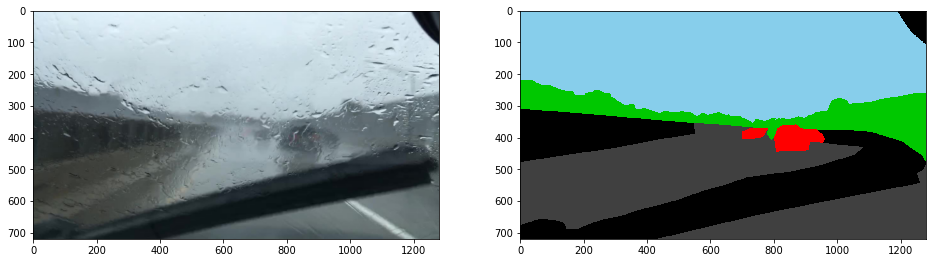

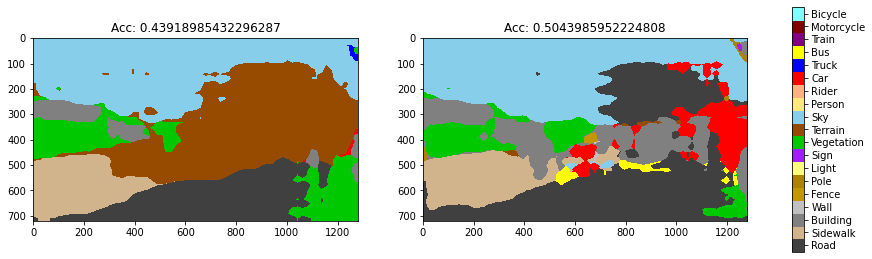

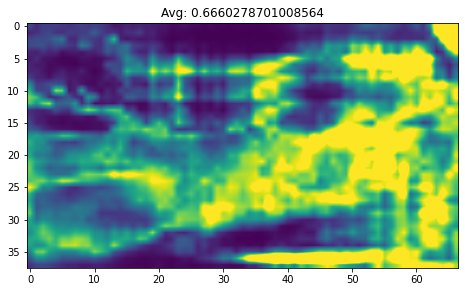

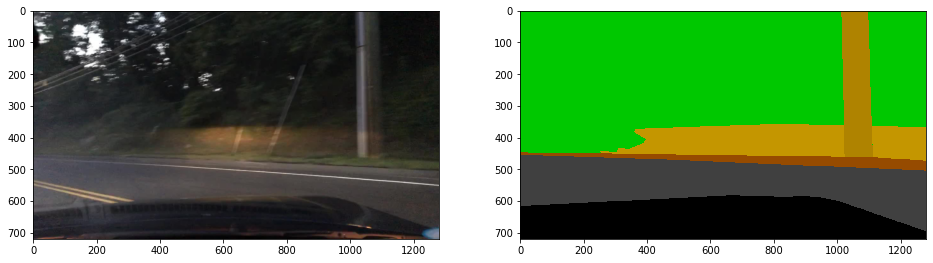

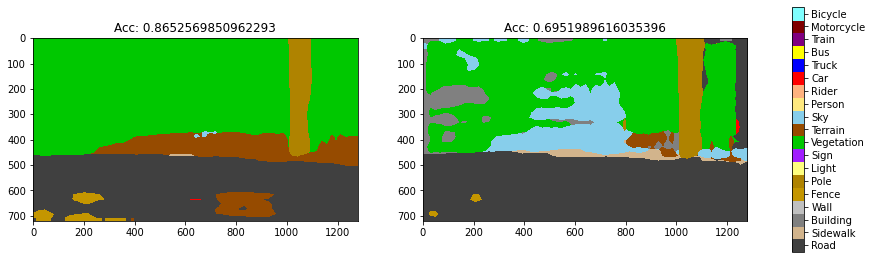

...

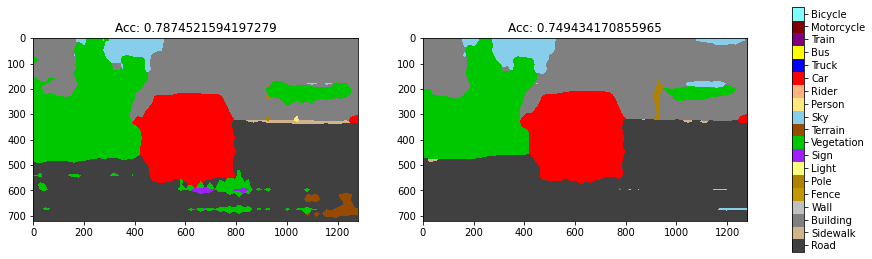

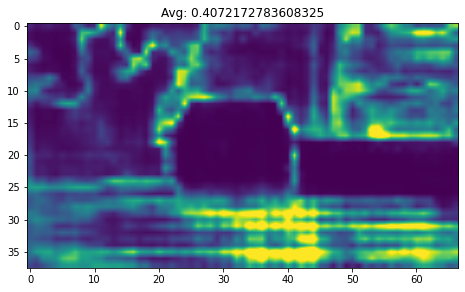

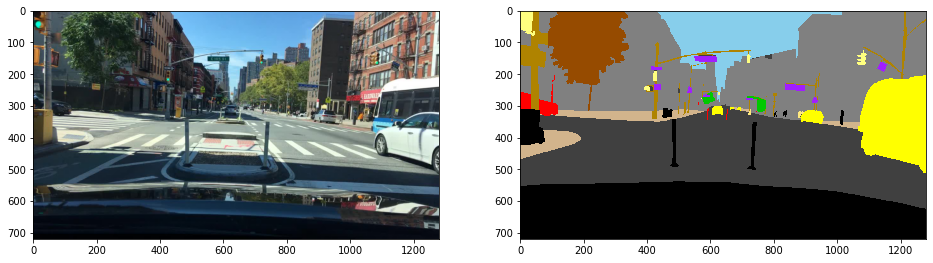

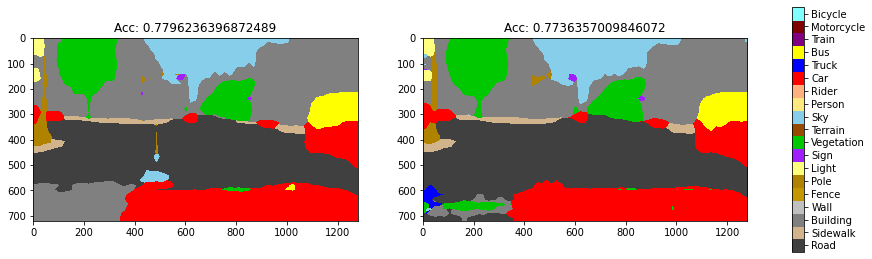

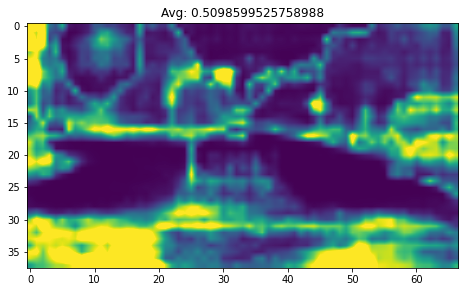

In [308]:
for i in range(10):
    b = bad_combined_val[i]
    bb = subbatch(b, 0)
    det_scores = seg_module(bb, segSize=segSize)[0].cpu()
    bnn_scores = bnn_module.all_predictions(bb)[:, 0].cpu()
    bnn_scores1 = predict(bnn_scores, segSize)
    
    _=plt.subplot(121);
    _=plt.imshow(b['img_ori']);
    _=plt.subplot(122);
    show_seg(b['seg_label'][0].cpu().numpy());
    plt.show();
    
    _=plt.subplot(121);
    show_seg(det_scores.argmax(0).numpy());
    _=plt.title('Acc: %s' % accuracy(det_scores.argmax(0).numpy(), as_numpy(bb['seg_label'][0]))[0]);
    _=plt.subplot(122);
    show_seg(bnn_scores1.argmax(0).numpy());
    _=plt.title('Acc: %s' % accuracy(bnn_scores1.argmax(0).numpy(), as_numpy(bb['seg_label'][0]))[0])
    colorbar();
    plt.show()
    
#     maybe = maybe_select(bnn_scores, majority_threshold=.2)
#     show_seg(maybe.numpy())
#     plt.show()
    
    uncert, per_class = uncertainty(bnn_scores)
    _=plt.imshow(uncert, vmin=0, vmax=1, interpolation='bilinear');
    _=plt.title('Avg: %s' % np.mean(uncert**2)**.5)
    plt.show()